In [1]:
cluster = 'a2744'
zclus = {'a2744' : 0.308,
         'm0416' : 0.396}
pgals = {'a2744' : [1.689791e-01, 1.965115e+00, 2.0],
        'm0416' : [3.737113e-01, 1.322081e+00, 2.0]}
nclus = {'a2744': "Abell 2744",
         'm0416' : "MACS 0416"}

zlens = zclus[cluster]
import sys
utils = 'C:\\Users\\Jackson\\Jupyter projects\\Master\\Utility\\'
sys.path.insert(0, utils)

root = 'C:\\Users\\Jackson\\Jupyter projects\\'
sys.path.insert(0, root)
filebase = 'C:\\Users\\Jackson\\Jupyter projects\\Master\\' + nclus[cluster] + "\\Files\\"

import numpy as np
import numpy.ma as ma
from astropy.cosmology import FlatLambdaCDM
from os import listdir
from os.path import isfile, join
import MCUtil as MC
import DeltaSquared as DS
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as col
import statistics
import fitClusParallel as myfit
import corner

cosmo = FlatLambdaCDM(H0=70, Om0=0.3)

In [5]:
posMag = np.load(filebase + "Galaxy Data\\ColorMagnitudePosition.npz")
for key in posMag.keys():
    print(key)
clustnum = int(np.sum(posMag["yData"]))
Xcm = posMag["knownXData"]

def photProbs(gals):
    specs = posMag["unknownXData"]
#     print(specs)
    phots = []
    for gal in gals:
        isPhot = False
        for spec in specs:
            if (gal[0] == spec[2] and gal[1] == spec[3]):
                isPhot = True
                break
        
        if isPhot:
            phots.append([spec[0], spec[1], gal[3]])
        
    phots = np.array(phots)
    return phots

def scatterDraw(fig, ax, phots):
    scatter = ax.scatter(phots[:,0], phots[:,1], c=phots[:,2], norm = col.Normalize(vmin=0, vmax=1), 
                        cmap=plt.get_cmap("magma"), label = "Uncertain Galaxies", s = 100)
    cb = fig.colorbar(cm.ScalarMappable(cmap="magma"), ax=ax, fraction = 0.09, label = "cluster probability")
    cb.set_label("Cluster probability", fontsize = 22)


def drawCM(filename):
    gals = np.loadtxt(filename)
    phots = photProbs(gals)
    fig, ax = plt.subplots(1, 1, figsize=(15,5))

    scatterDraw(fig, ax, phots)
    ax.scatter(Xcm[:clustnum,0], Xcm[:clustnum,1], color="red", label = 'Spectroscopic members', marker = "x", s = 100)
    ax.scatter(Xcm[clustnum:,0], Xcm[clustnum:,1], color="blue", label = 'Spectroscopic non-members', marker = "x", s = 100)
    
    ax.legend(fontsize = 15)
    
    ax.set_ylabel("F606W - F814W", fontsize = 22)
    ax.set_xlabel("Magnitude: F814W", fontsize = 22)

knownXData
unknownXData
yData
clusterPosMag
unknownPosMag


Text(0.5, 0, 'Magnitude: F814W')

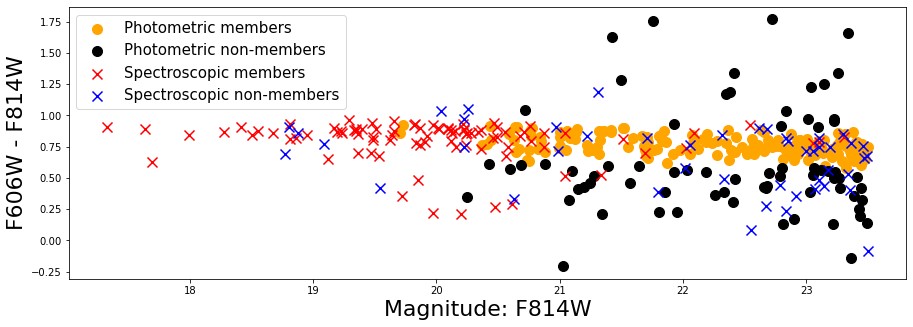

In [26]:
#Fiducial plot of the deterministic selection
gals = np.loadtxt(filebase + "Galaxy Probability Files\\CM + sigmaDet")
phots = photProbs(gals)

mem_inds = np.where(phots[:,2] == 1)
los_inds = np.where(phots[:,2] == 0)

plt.figure(figsize = (15, 5))
plt.scatter(phots[mem_inds, 0], phots[mem_inds, 1], color = 'orange', s = 100, label = "Photometric members")
plt.scatter(phots[los_inds, 0], phots[los_inds, 1], color = 'black', s = 100, label = "Photometric non-members")

plt.scatter(Xcm[:clustnum,0], Xcm[:clustnum,1], color="red", label = 'Spectroscopic members', marker = "x", s = 100)
plt.scatter(Xcm[clustnum:,0], Xcm[clustnum:,1], color="blue", label = 'Spectroscopic non-members', marker = "x", s = 100)

plt.legend(fontsize = 15)

plt.ylabel("F606W - F814W", fontsize = 22)
plt.xlabel("Magnitude: F814W", fontsize = 22)

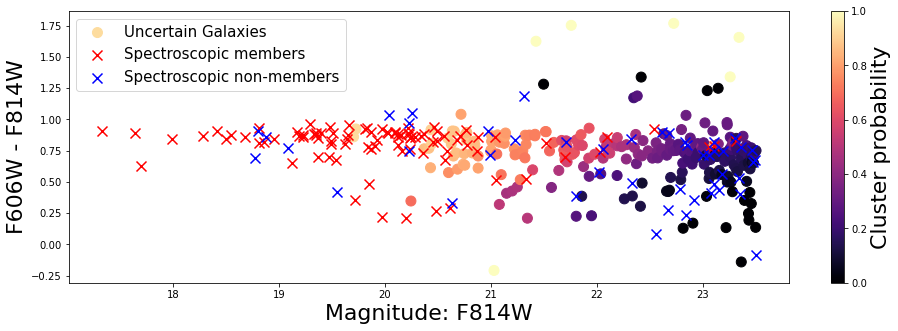

In [19]:
drawCM(filebase + "Galaxy Probability Files\\CM + rnn")

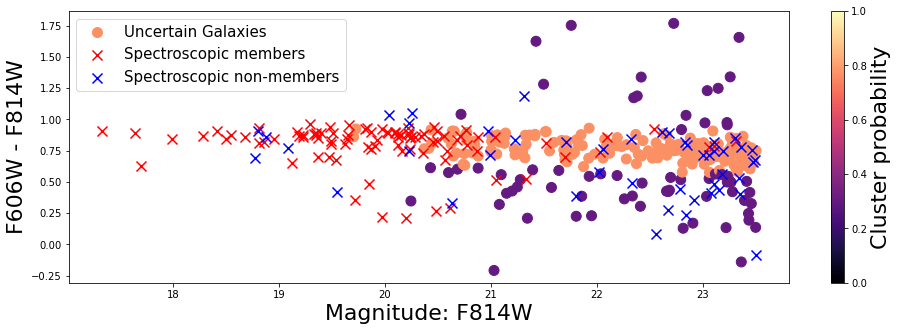

In [20]:
drawCM(filebase + "Galaxy Probability Files\\CM + sigmaProb")

In [5]:
img = myfit.imgclass(root + "Files/" + cluster + '_images.dat',zlens,cosmo)

Read image data from file C:\Users\Jackson\Jupyter projects\Files/a2744_images.dat


Read galaxy data from file C:\Users\Jackson\Jupyter projects\Master\Abell 2744\Files\Galaxy Probability Files\CM + SigmaDet
Read galaxy data from file C:\Users\Jackson\Jupyter projects\Master\Abell 2744\Files\Galaxy Probability Files\CM + rnn
Mass scatter: 
X mean: -0.00881355190989463
X std: 0.07998890392566127
Y mean: -0.021988127997749022
Y std: 0.08825788739972623


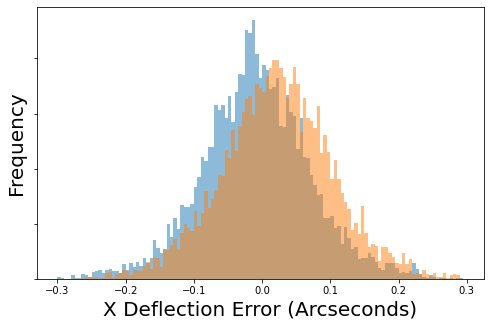

In [6]:
#get overall histograms
def plothist(file, ax):
    pdelta = []
    gal = myfit.galclass(file, logflags = [True, True])
    gal.scale(b0 = 0.0)
    
    #print(gal.dat)
    
    for i in range(reps):
        gal.draw(True)
        deftmp = gal.calcdef(img)[0]
        deftmp = deftmp*np.reshape(img.Darr,(img.nimg,1))
        
        #print(np.sum(gal.p[:,7]))

        pdelta.append(deftmp - defbase)
        
    pdelta = np.array(pdelta)
    pdeltax = np.reshape(pdelta[:,:,0], (-1))
    pdeltay = np.reshape(pdelta[:,:,1], (-1))

    ax.hist(mdeltax, bins = bins, alpha = 0.5)
    ax.hist(pdeltax, bins = bins, alpha = 0.5)

reps = 100

gal = myfit.galclass(filebase + "Galaxy Probability Files\\CM + SigmaDet", logflags = [True, True])
gal.scale(b0 = 0.0)
gal.draw(False)

defbase = gal.calcdef(img)[0]
defbase = defbase*np.reshape(img.Darr,(img.nimg,1))

mdelta = []

for i in range(reps):
    gal.draw(True)
    deftmp = gal.calcdef(img)[0]
    deftmp = deftmp*np.reshape(img.Darr,(img.nimg,1))
    mdelta.append(deftmp - defbase)
    
mdelta = np.array(mdelta)

mdeltax = np.reshape(mdelta[:,:,0], (-1))
mdeltay = np.reshape(mdelta[:,:,1], (-1))
bins = np.arange(-0.3, 0.3, 0.005)

fig, ax = plt.subplots(figsize=(8, 5))


plothist(filebase + "Galaxy Probability Files\\CM + rnn", ax)

#ax2.set_title("R nearest neighbors y error")

ax.set_ylabel("Frequency", fontsize = 20)
ax.set_xlabel("X Deflection Error (Arcseconds)", fontsize = 20)
#ax.set_title("", fontsize = 20)
ax.yaxis.set_ticklabels([])

print("Mass scatter: ")
print("X mean: " + str(np.mean(mdeltax)))
print("X std: " + str(np.std(mdeltax)))
print("Y mean: " + str(np.mean(mdeltay)))
print("Y std: " + str(np.std(mdeltay)))

In [ ]:
#get overall histograms
def plothist(file, ax):
    pdelta = []
    gal = myfit.galclass(file, logflags = [True, True])
    gal.scale(b0 = 0.0)
    
    #print(gal.dat)
    
    for i in range(reps):
        if (i % 100 == 0):
            print(i)
        gal.draw(True)
        deftmp = gal.calcdef(img)[0]
        deftmp = deftmp*np.reshape(img.Darr,(img.nimg,1))
        
        #print(np.sum(gal.p[:,7]))

        pdelta.append(deftmp - defbase)
        
    pdelta = np.array(pdelta)
    pdeltax = np.reshape(pdelta[:,:,0], (-1))
    pdeltay = np.reshape(pdelta[:,:,1], (-1))

    ax.hist(mdeltax, bins = bins, alpha = 0.5)
    ax.hist(pdeltax, bins = bins, alpha = 0.5)

reps = 3000

gal = myfit.galclass(filebase + "Galaxy Probability Files\\CM + SigmaDet", logflags = [True, True])
gal.scale(b0 = 0.0)
gal.draw(False)

defbase = gal.calcdef(img)[0]
defbase = defbase*np.reshape(img.Darr,(img.nimg,1))

mdelta = []

for i in range(reps):
    gal.draw(True)
    deftmp = gal.calcdef(img)[0]
    deftmp = deftmp*np.reshape(img.Darr,(img.nimg,1))
    mdelta.append(deftmp - defbase)
    
mdelta = np.array(mdelta)

mdeltax = np.reshape(mdelta[:,:,0], (-1))
mdeltay = np.reshape(mdelta[:,:,1], (-1))
bins = np.arange(-0.3, 0.3, 0.005)

fig, ax = plt.subplots(figsize=(8, 5))


plothist(filebase + "Galaxy Probability Files\\CM + sigmaProb", ax)

#ax2.set_title("R nearest neighbors y error")

ax.set_ylabel("Frequency", fontsize = 20)
ax.set_xlabel("X Deflection Error (Arcseconds)", fontsize = 20)
#ax.set_title("", fontsize = 20)
ax.yaxis.set_ticklabels([])

print("Mass scatter: ")
print("X mean: " + str(np.mean(mdeltax)))
print("X std: " + str(np.std(mdeltax)))
print("Y mean: " + str(np.mean(mdeltay)))
print("Y std: " + str(np.std(mdeltay)))

In [9]:
#Parameter distribution comparison
def compareMC(file1, file2, features):

    chain1 = np.load(file1)
    chain2 = np.load(file2)
    nplots = len(features)

    print(chain1.shape)

    fig, ax  = plt.subplots(1, nplots, figsize = (15, 5))
    
    for i in range(nplots):
        feature = features[i]
        print(feature)
        dist1 = chain1[:,feature]
        dist2 = chain2[:,feature]
        bins = np.linspace(np.min(dist1), np.max(dist1), 23)
        
        print(np.min(dist1))
        ax[i].hist(chain1[:,feature], histtype='step',  bins = bins)
        ax[i].hist(chain2[:,feature], histtype='step',  bins = bins)
        ax[i].yaxis.set_ticklabels([])

In [46]:
def MCplot(labels=None,fmt='.2f',truths=None, reshapedchain1 = None, reshapedchain2 = None):

        fig = corner.corner(reshapedchain1,show_titles=True, title_fmt=fmt,labels=labels, color = "red", bins = 23)
        
        corner.corner(reshapedchain2, fig=fig, color = "blue", bins = 23)

In [47]:
def overlayCorners(file1, file2):
    plabels = ['bgal', 'agal', 'alos',
     'b1', 'x1', 'y1', 'ec1', 'es1', 's1',
     'b2', 'x2', 'y2', 'ec2', 'es2', 's2',
     'b3', 'x3', 'y3', 'ec3', 'es3', 's3',
     'gc', 'gs']
    
    chain1 = np.load(file1)
    chain2 = np.load(file2)


    MCplot(labels=plabels,fmt='.3f', reshapedchain1 = chain1, reshapedchain2 = chain2)

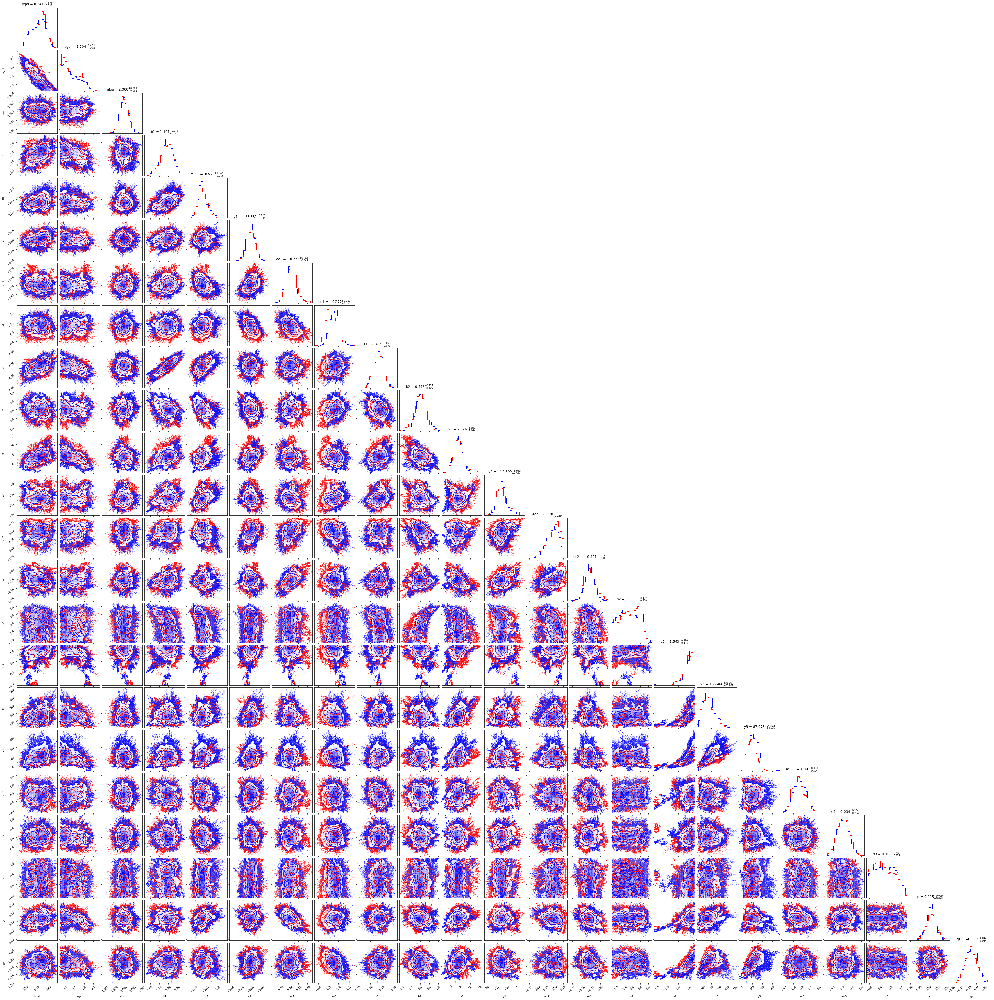

In [50]:
overlayCorners(file1, file2)

(250000, 23)
7
-0.3956251101365862
17
-35.03459333198214
20
-1.0013816054431386


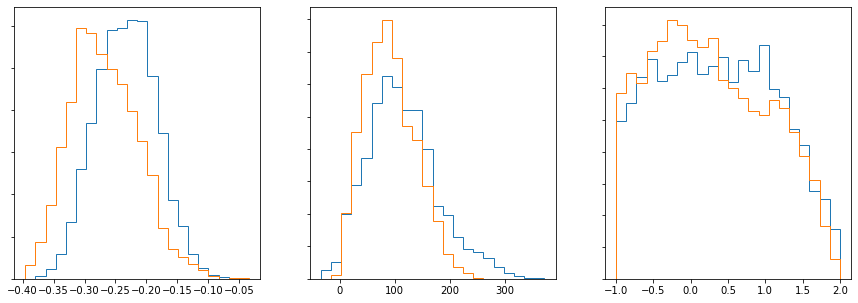

In [13]:
file1 = filebase + "MCMC\\CM + sigmaDet-main.npy"
file2 = filebase + "MCMC\\CM + rnn-main.npy"
compareMC(file1, file2, [7, 17, 20])

In [7]:
plabels = ['bgal', 'agal', 'alos',
     'b1', 'x1', 'y1', 'ec1', 'es1', 's1',
     'b2', 'x2', 'y2', 'ec2', 'es2', 's2',
     'b3', 'x3', 'y3', 'ec3', 'es3', 's3',
     'gc', 'gs']

print(plabels[7])
print(plabels[17])
print(plabels[20])

es1
y3
s3


(250000, 23)
7
-0.3956251101365862
17
-35.03459333198214
20
-1.0013816054431386


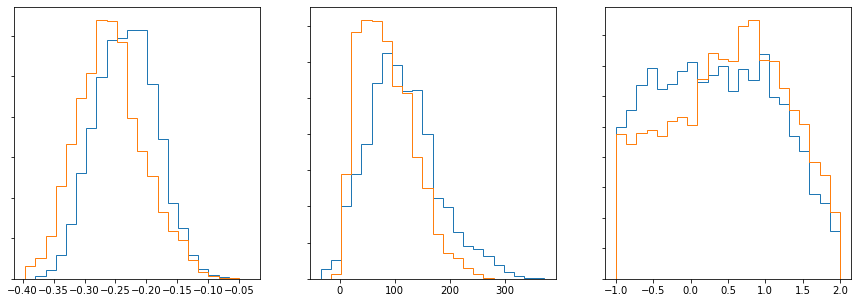

In [14]:
file1 = filebase + "MCMC\\CM + sigmaDet-main.npy"
file2 = filebase + "MCMC\\CM + sigmaProb-main.npy"
compareMC(file1, file2, [7, 17, 20])